# Fusemap tutorial VI: Exploring cell-to-cell interactions

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import statsmodels.stats.multitest

## 0. Download the source data (single zip)

In [3]:
import os
import gdown

if not os.path.exists("./tutorial6_data/tutorial6_source_data"):
    os.makedirs("./tutorial6_data", exist_ok=True)
    gdown.download(id="REPLACE_TUTORIAL6_ZIP_ID", output="./tutorial6_data/tutorial6_source_data.zip", quiet=False)
    import zipfile
    with zipfile.ZipFile("./tutorial6_data/tutorial6_source_data.zip") as z:
        z.extractall("./tutorial6_data")

In [4]:
# At the beginning of the notebook, after imports
SOURCE_DATA_BASE = './tutorial6_data/tutorial6_source_data'

# Define common subdirectories
def get_paths(focus_key):
    paths = {
        'ct_labels': f'{SOURCE_DATA_BASE}/df_ct_labels_{focus_key}.csv',
        'cells_by_regions': f'{SOURCE_DATA_BASE}/cells_by_regions_{focus_key}',
        'outputs_30um': f'{SOURCE_DATA_BASE}/outputs_30um_{focus_key}',
        'color': f'{SOURCE_DATA_BASE}/color/starmap_sub.csv'
    }
    return paths

## 1. Get cells by regions

In [5]:
def get_confusion_count_df(df, col1, col2):
    '''Get the confusion matrix between two categorical columns in a dataframe.'''
    assert((col1 != 'count') and (col2 != 'count'))
    count_df = df[[col1, col2]].copy()
    count_df['count'] = 1
    
    conf_df = pd.pivot_table(count_df, index=[col1], columns=[col2], 
                              values='count', aggfunc=np.sum).fillna(0)
    
    return conf_df
        
def get_expected_count_df(conf_df):
    mtx = conf_df.values
    
    total_count = np.sum(mtx)
    row_fractions = np.sum(mtx, axis=1) / total_count
    col_fractions = np.sum(mtx, axis=0) / total_count
    
    expect_fractions = row_fractions[:, np.newaxis] * col_fractions[np.newaxis, :]
    expected_count_df = pd.DataFrame(data=expect_fractions * total_count, 
                                     index=conf_df.index, columns=conf_df.columns)
    
    return expected_count_df

In [6]:
for focus_key in ['Atlas1','Atlas2','Atlas3']:
    df_ct_labels=pd.read_csv(f'{SOURCE_DATA_BASE}/df_ct_labels_{focus_key}.csv',index_col=0)
    output_path = f'{SOURCE_DATA_BASE}/cells_by_regions_{focus_key}'
    os.makedirs(output_path, exist_ok=True)
    
    # Get the confusion matrix data frame
    conf_df = get_confusion_count_df(df_ct_labels, 'transfer_gt_cell_type_sub_STARmap', 'transfer_gt_tissue_region_main_STARmap')

    # Calculate the enrichment matrix data frame
    expected_count_df = get_expected_count_df(conf_df)
    region_enrichment_df = conf_df / expected_count_df.values

    major_brain_regions = list(df_ct_labels['transfer_gt_tissue_region_main_STARmap'].unique())

    for r in major_brain_regions:
        print(r)

        region_df_ct_labels = df_ct_labels[df_ct_labels['transfer_gt_tissue_region_main_STARmap'] == r]

        subclasses, counts = np.unique(region_df_ct_labels['transfer_gt_cell_type_sub_STARmap'], return_counts=True)
        selected_subclasses = []



        for i in np.argsort(-counts):

            selected = False
            neuron_cattegory_label=df_ct_labels.loc[df_ct_labels['transfer_gt_cell_type_sub_STARmap']==subclasses[i],'neuron_category'].unique()[0]

            # For non-neuronal, non-astrocytes
            if neuron_cattegory_label=='non' and (not subclasses[i].startswith('AC')):       
                if counts[i] > 50:
                    selected = True
                    selected_subclasses.append(subclasses[i])

            # For astrocytes
            elif subclasses[i].startswith('AC'):
                if region_enrichment_df.loc[subclasses[i], r] > 1:
                    selected = True
                    selected_subclasses.append(subclasses[i])

            # For neurons
            else:
                threshold = 6

                if region_enrichment_df.loc[subclasses[i], r] > threshold:
                    selected = True
                    selected_subclasses.append(subclasses[i])


        region_df_ct_labels = region_df_ct_labels[region_df_ct_labels['transfer_gt_cell_type_sub_STARmap'].isin(
                                    selected_subclasses)].copy()
        region_df_ct_labels.to_csv(os.path.join(output_path, f'{r}.csv'))


L1_HPFmo_Mngs


CTX_1


CTX_2


FbTrt


STR


LSX_HY_MB_HB


OB_1


Hbl_VS


HPF_CA


DG


ENTm


CB_2


CB_1


TH


OB_2


MYdp


HY


LSX_HY_MB_HB


FbTrt


CB_1


CB_2


MYdp


Hbl_VS


L1_HPFmo_Mngs


TH


CTX_1


CTX_2


ENTm


DG


HPF_CA


HY


OB_1


STR


OB_2


OB_2


OB_1


L1_HPFmo_Mngs


CTX_2


FbTrt


CTX_1


LSX_HY_MB_HB


STR


Hbl_VS


HPF_CA


TH


DG


HY


ENTm


CB_2


CB_1


MYdp


## 2. Randomize and count cell-cell contacts within 30µm

In [7]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import anndata
import scanpy as sc
sc.settings.n_jobs = 8
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')
from tqdm import tqdm
import sys
sys.path.append('.')
from fusemap.permutation import generate_cell_type_contact_count_matrices

Count cell-cell contacts at the subclass level

In [8]:
major_brain_regions = ['LSX_HY_MB_HB',
 'FbTrt',
 'CB_1',
 'CB_2',
 'MYdp',
 'Hbl_VS',
 'L1_HPFmo_Mngs',
 'TH',
 'CTX_1',
 'CTX_2',
 'ENTm',
 'DG',
 'HPF_CA',
 'HY',
 'OB_1',
 'STR',
 'OB_2']

In [9]:
# Make the output path

for focus_key in ['Atlas1','Atlas2','Atlas3']:

    output_path = f'{SOURCE_DATA_BASE}/outputs_30um_{focus_key}'
    os.makedirs(output_path, exist_ok=True)

    r_radius=1.997*2
    r_permute_radius=13.315

    for region in major_brain_regions:
        # precomputed results ship with the download - delete them to recompute
        if os.path.exists(os.path.join(output_path, f'{region}_local_permutation_mean.npy')):
            print(region, '(precomputed, skipping)')
            continue
        print(region)

        # Read the data
        df_ct_labels = pd.read_csv(os.path.join(f'{SOURCE_DATA_BASE}/cells_by_regions_{focus_key}', f'{region}.csv'), index_col=0)
        slice_ids = np.unique(df_ct_labels['ap_order'])


        cell_type_col = 'transfer_gt_cell_type_sub_STARmap'
        cell_types = np.unique(df_ct_labels[cell_type_col])
        N_cell_types = len(cell_types)
        N_permutations = 1000

        # Count and save the contacts without permutation
        merged_contact_counts = np.zeros((N_cell_types, N_cell_types), dtype=int)
        for slice_id in tqdm(slice_ids):
            df_slice = df_ct_labels[df_ct_labels['ap_order'] == slice_id]
            cell_type_contact_counts = generate_cell_type_contact_count_matrices(df_slice, cell_type_col, 
                                            ['use_x', 'use_y'], cell_types, 
                                            permutation_method='no_permutation', contact_radius=r_radius)

            merged_contact_counts = merged_contact_counts + cell_type_contact_counts
        output_file = os.path.join(output_path, f'{region}_no_permutation.npy')
        np.save(output_file, merged_contact_counts)


        from multiprocessing import Pool
        def permute_and_count_contacts_for_slices(df_slice_list):
            merged_contact_counts = np.zeros((N_permutations, N_cell_types, N_cell_types), dtype=int)
            for df_slice in df_slice_list:
                for i in tqdm(range(N_permutations)):
                    df_slice_rand = df_slice.copy()
                    r_permute = r_permute_radius
                    r = r_permute * np.sqrt(np.random.uniform(size=df_slice_rand.shape[0]))
                    theta = np.random.uniform(size=df_slice_rand.shape[0]) * 2 * np.pi

                    df_slice_rand['use_x'] += r * np.sin(theta)
                    df_slice_rand['use_y'] += r * np.cos(theta)

                    cell_type_contact_counts = generate_cell_type_contact_count_matrices(df_slice_rand, cell_type_col, 
                                            ['use_x', 'use_y'], cell_types, 
                                            permutation_method='no_permutation', contact_radius=r_radius)
                    merged_contact_counts[i] = merged_contact_counts[i] + cell_type_contact_counts
            return merged_contact_counts



        # Get the dataframe for each slice
        all_df_slice_list = [df_ct_labels[df_ct_labels['ap_order'] == slice_id] for slice_id in slice_ids]


        # Split the slices into groups
        N_groups = 16
        group_size = int(np.ceil(len(slice_ids) / N_groups))
        grouped_slice_dfs = []
        for i in range(N_groups):
            slice_id_start = i * group_size
            slice_id_stop = (i + 1) * group_size
            grouped_slice_dfs.append(all_df_slice_list[slice_id_start:slice_id_stop])


        # Permute and count the contacts in parallel
        print('start')
        with Pool(N_groups) as p:
            contact_analysis_results = p.map(permute_and_count_contacts_for_slices, grouped_slice_dfs)
        merged_contact_counts = np.sum(contact_analysis_results, axis=0)

        means = np.mean(merged_contact_counts, axis=0)
        stds = np.std(merged_contact_counts, axis=0)

        np.save(os.path.join(output_path, f'{region}_local_permutation_count_tensor.npy'),
                merged_contact_counts)

        output_file_mean = os.path.join(output_path, f'{region}_local_permutation_mean.npy')
        np.save(output_file_mean, means)
        output_file_std = os.path.join(output_path, f'{region}_local_permutation_std.npy')
        np.save(output_file_std, stds)

        

LSX_HY_MB_HB (precomputed, skipping)
FbTrt (precomputed, skipping)
CB_1 (precomputed, skipping)
CB_2 (precomputed, skipping)
MYdp (precomputed, skipping)
Hbl_VS (precomputed, skipping)
L1_HPFmo_Mngs (precomputed, skipping)
TH (precomputed, skipping)
CTX_1 (precomputed, skipping)
CTX_2 (precomputed, skipping)
ENTm (precomputed, skipping)
DG (precomputed, skipping)
HPF_CA (precomputed, skipping)
HY (precomputed, skipping)
OB_1 (precomputed, skipping)
STR (precomputed, skipping)
OB_2 (precomputed, skipping)
LSX_HY_MB_HB (precomputed, skipping)
FbTrt (precomputed, skipping)
CB_1 (precomputed, skipping)
CB_2 (precomputed, skipping)
MYdp (precomputed, skipping)
Hbl_VS (precomputed, skipping)
L1_HPFmo_Mngs (precomputed, skipping)
TH (precomputed, skipping)
CTX_1 (precomputed, skipping)
CTX_2 (precomputed, skipping)
ENTm (precomputed, skipping)
DG (precomputed, skipping)
HPF_CA (precomputed, skipping)
HY (precomputed, skipping)
OB_1 (precomputed, skipping)
STR (precomputed, skipping)
OB_2 (pre

## 3. Get significant contacts within 30µm

In [10]:
def count_zero_pairs(contact_mtx):
    n_0 = 0
    for i in range(contact_mtx.shape[0]):
        for j in range(i, contact_mtx.shape[0]):
            if contact_mtx[i, j] == 0:
                n_0 += 1
    return n_0

def adjust_p_value_matrix_by_BH(p_val_mtx):
    '''Adjust the p-values in a matrix by the Benjamini/Hochberg method.
    The matrix should be symmetric.
    '''
    p_val_sequential = []
    N = p_val_mtx.shape[0]
    
    for i in range(N):
        for j in range(i, N):
            p_val_sequential.append(p_val_mtx[i, j])

    p_val_sequential_bh = statsmodels.stats.multitest.multipletests(p_val_sequential, method='fdr_bh')[1]
    
    adjusted_p_val_mtx = np.zeros((N, N))
    
    counter = 0
    for i in range(N):
        for j in range(i, N):
            adjusted_p_val_mtx[i, j] = p_val_sequential_bh[counter]
            adjusted_p_val_mtx[j, i] = p_val_sequential_bh[counter]
            counter += 1
            
    return adjusted_p_val_mtx

def get_data_frame_from_metrices(cell_types, mtx_dict):
    N = len(cell_types)
    
    serials_dict = {'cell_type1':[], 'cell_type2':[]}
    for k in mtx_dict.keys():
        serials_dict[k] = []
        
    for i in range(N):
        for j in range(i, N):
            serials_dict['cell_type1'].append(cell_types[i])
            serials_dict['cell_type2'].append(cell_types[j])
            for k in mtx_dict.keys():
                serials_dict[k].append(mtx_dict[k][i, j])
                
    return pd.DataFrame(serials_dict)
    

def sort_cell_type_contact_p_values(p_val_mtx, cell_types):
    '''Return a list of (cell_type1, cell_type2, p_value) sorted by p_values.'''
    p_val_list = []
    N = p_val_mtx.shape[0]
    for i in range(N):
        for j in range(i, N):
            p_val_list.append((cell_types[i], cell_types[j], p_val_mtx[i, j]))
    return sorted(p_val_list, key=lambda x:x[2])

In [11]:
import scipy.cluster
# from scattermap import scattermap

def get_optimal_order_of_mtx(X):
    Z = scipy.cluster.hierarchy.ward(X)
    return scipy.cluster.hierarchy.leaves_list(
        scipy.cluster.hierarchy.optimal_leaf_ordering(Z, X))

def get_ordered_tick_labels(tick_labels):
    tick_labels_with_class = [s.split(' ')[-1] + ' ' + s for s in tick_labels]
    return np.argsort(tick_labels_with_class)

def filter_pval_mtx(pval_mtx, tick_labels, allowed_pairs):
    pval_mtx_filtered = pval_mtx.copy()
    
    for i in range(pval_mtx.shape[0]):
        ct1 = tick_labels[i]
        for j in range(pval_mtx.shape[1]):
            ct2 = tick_labels[j]
            
            if ((ct1, ct2) in allowed_pairs) or ((ct2, ct1) in allowed_pairs):
                continue
            else:
                pval_mtx_filtered[i, j] = 1
            
    return pval_mtx_filtered


In [12]:
def make_dotplot(pval_mtx, fold_change_mtx, tick_labels, title='', allowed_pairs=None):

    #optimal_order = get_optimal_order_of_mtx(pval_mtx)
    optimal_order = get_ordered_tick_labels(tick_labels)
    
    pval_mtx = pval_mtx[optimal_order][:, optimal_order]
    fold_change_mtx = fold_change_mtx[optimal_order][:, optimal_order]
    tick_labels = tick_labels[optimal_order]
    
    if None is not allowed_pairs:
        pval_mtx = filter_pval_mtx(pval_mtx, tick_labels, allowed_pairs)
    
    pval_mtx[pval_mtx>0.05]=1
    mlog_pvals = - np.log10(np.maximum(pval_mtx, 1e-10))
    fold_change_mtx[mlog_pvals==0]=0

    fold_change_mtx=np.log10(fold_change_mtx+1)*100

    fig_len = len(tick_labels) * 0.1
#     fig = plt.figure(figsize=(fig_len, fig_len), dpi=300)


    fig,ax = scattermap(mlog_pvals, marker_size= fold_change_mtx,
                square=True, 
                cmap="Reds",
                linewidths=0.2 * (pval_mtx < 0.05).reshape(-1), 
                linecolor='black', xticklabels=tick_labels, yticklabels=tick_labels,
                vmin=0, vmax=np.max(mlog_pvals), 
                cbar_kws={'shrink':0.5, 'anchor':(0, 0.7)})
    
    plt.tight_layout()
    fig.savefig(f'figures_{focus_key}/{title}.png',dpi=300)#, transparent=True)

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

def scattermap(data_matrix, marker_size, square=True, cmap='coolwarm', 
               linewidths=0, linecolor='black', xticklabels=None, yticklabels=None, 
               vmin=None, vmax=None, cbar_kws=None):
    if vmin is None:
        vmin = data_matrix.min()
    if vmax is None:
        vmax = data_matrix.max()

    norm = Normalize(vmin=vmin, vmax=vmax)
    fig, ax = plt.subplots()
    cmap = plt.get_cmap(cmap)

    # Plot each data point individually
    n, m = data_matrix.shape
    for i in range(n):
        for j in range(m):
            color = cmap(norm(data_matrix[i, j]))
            size = marker_size[i, j] if marker_size.shape == data_matrix.shape else marker_size
            ax.scatter(j, i, color=color, s=size)

    # Customizations
    ax.set_xticks(np.arange(m))
    ax.set_yticks(np.arange(n))
    ax.set_xticklabels(xticklabels if xticklabels is not None else np.arange(m), rotation=90)
    ax.set_yticklabels(yticklabels if yticklabels is not None else np.arange(n))

    ax.invert_yaxis()
    
    # Gridlines based on the data positions
    ax.set_xticks(np.arange(m+1)-.5, minor=True)
    ax.set_yticks(np.arange(n+1)-.5, minor=True)
#     ax.grid(which="minor", color="w", linestyle='-', linewidth=2)
    ax.tick_params(which="minor", size=0)

    # Colorbar
    if cbar_kws is None:
        cbar_kws = {}
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, **cbar_kws)
    cbar.set_label('log p value', rotation=270, labelpad=15)

    if square:
        plt.axis('equal')
#     plt.show()

    return fig,ax


In [13]:
for focus_key in ['Atlas1','Atlas1','Atlas1']:
    permutation_path = f'{SOURCE_DATA_BASE}/outputs_30um_{focus_key}'
    os.makedirs(permutation_path+'/result/', exist_ok=True)

    result_dfs = []
    
    
    for region in major_brain_regions:

        if os.path.exists(os.path.join(permutation_path, f'{region}_local_permutation_mean.npy')):
            print(region)

            # Load the cell type labels
            df_ct_labels = pd.read_csv(os.path.join(f'{SOURCE_DATA_BASE}/cells_by_regions_{focus_key}', f'{region}.csv'), index_col=0)


            subclass_types = np.unique(df_ct_labels['transfer_gt_cell_type_sub_STARmap'])

            cell_contact_counts = np.load(os.path.join(permutation_path, f'{region}_no_permutation.npy'))

            local_null_means = np.load(os.path.join(permutation_path, f'{region}_local_permutation_mean.npy'))
            local_null_stds = np.load(os.path.join(permutation_path, f'{region}_local_permutation_std.npy'))



            # Require all stds to be larger or equal to the minimal observable std value
            local_null_stds = np.maximum(local_null_stds, np.sqrt(1 / 1000))


            local_z_scores = (cell_contact_counts - local_null_means) / local_null_stds
            local_p_values = scipy.stats.norm.sf(local_z_scores)
            adjusted_local_p_values = adjust_p_value_matrix_by_BH(local_p_values)

            fold_changes = cell_contact_counts / (local_null_means + 1e-4)


            # Gather all results into a data frame
            contact_result_df = get_data_frame_from_metrices(subclass_types, 
                                                     {'pval-adjusted': adjusted_local_p_values,
                                                      'pval': local_p_values,
                                                      'z_score': local_z_scores,
                                                      'contact_count': cell_contact_counts,
                                                      'permutation_mean': local_null_means,
                                                      'permutatmerion_std': local_null_stds
                                                    }).sort_values('z_score', ascending=False)


            # Filter out pairs that don't contact
            contact_result_df = contact_result_df[contact_result_df['pval-adjusted'] < 0.05]
            contact_result_df = contact_result_df[contact_result_df['contact_count'] > 50]
            contact_result_df.to_csv(os.path.join(permutation_path+'/result/', f'{region}_close_contacts.csv'))

            contact_result_df['region']=region
            result_dfs.append(contact_result_df)

        else:
            print(region,'norun')
            
    combined_results = pd.concat(result_dfs)

    combined_results.to_csv(os.path.join(permutation_path+'/result/', 'all_close_contacts.csv'))

LSX_HY_MB_HB


FbTrt


CB_1


CB_2
MYdp
Hbl_VS


L1_HPFmo_Mngs


TH
CTX_1


CTX_2


ENTm
DG
HPF_CA
HY
OB_1


STR


OB_2
LSX_HY_MB_HB


FbTrt
CB_1


CB_2
MYdp
Hbl_VS


L1_HPFmo_Mngs


TH
CTX_1


CTX_2


ENTm
DG
HPF_CA
HY
OB_1


STR


OB_2
LSX_HY_MB_HB


FbTrt


CB_1


CB_2
MYdp
Hbl_VS


L1_HPFmo_Mngs


TH
CTX_1


CTX_2


ENTm
DG
HPF_CA
HY
OB_1


STR


OB_2


## 4. Plot arc diagram

In [14]:
import sys
sys.path.insert(0, f'{SOURCE_DATA_BASE}/arcplot-main/')
from arcplot import ArcDiagram


def NormalizeData(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

In [15]:
color_tissue=pd.read_csv(f'{SOURCE_DATA_BASE}/color/starmap_sub.csv')
dic_color={}
for key,color in zip(color_tissue['key'],color_tissue['color']):
    dic_color[key]=color

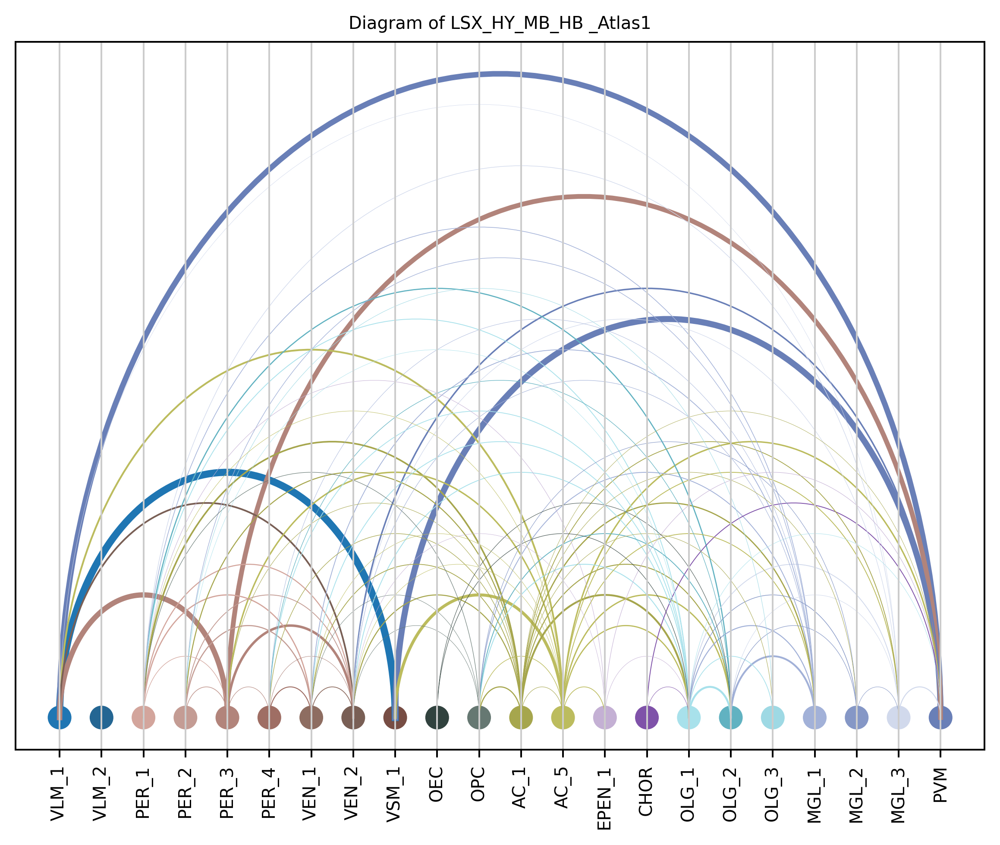

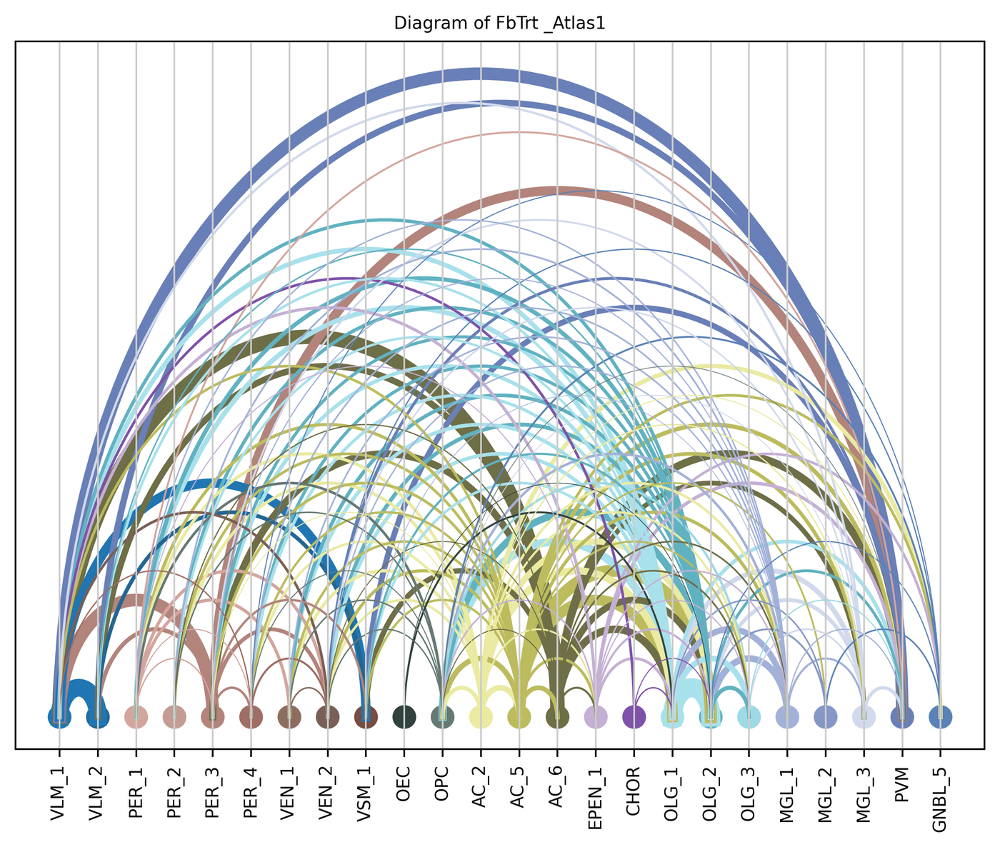

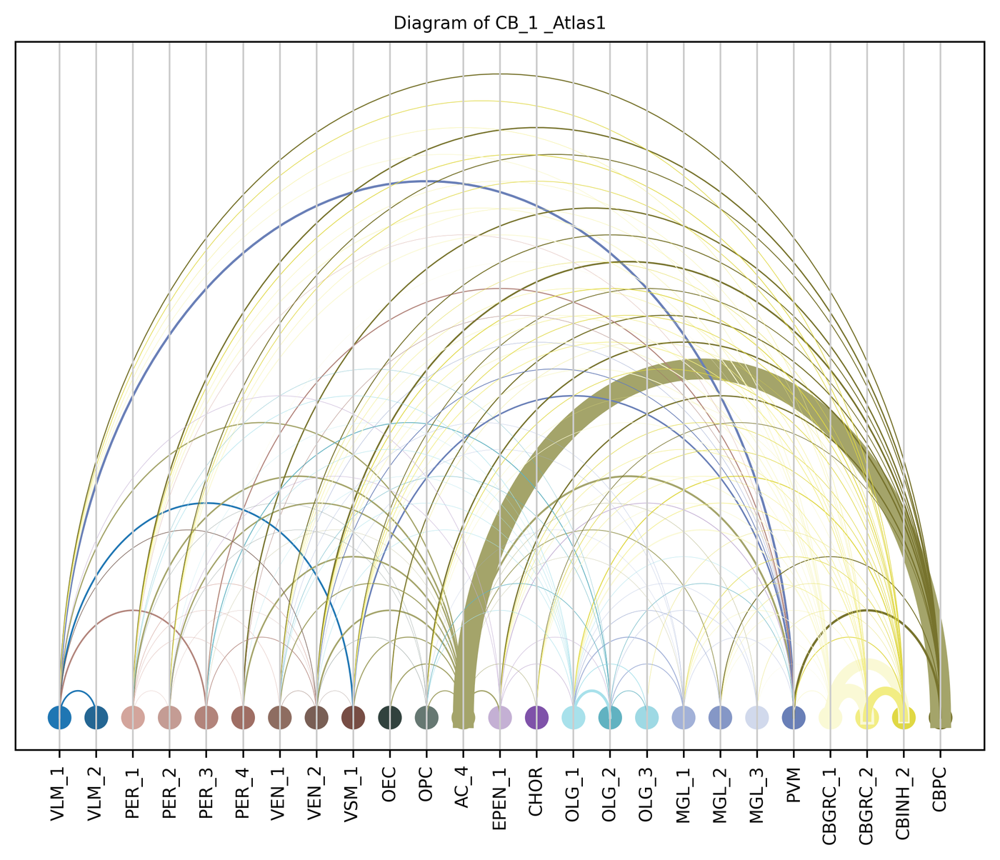

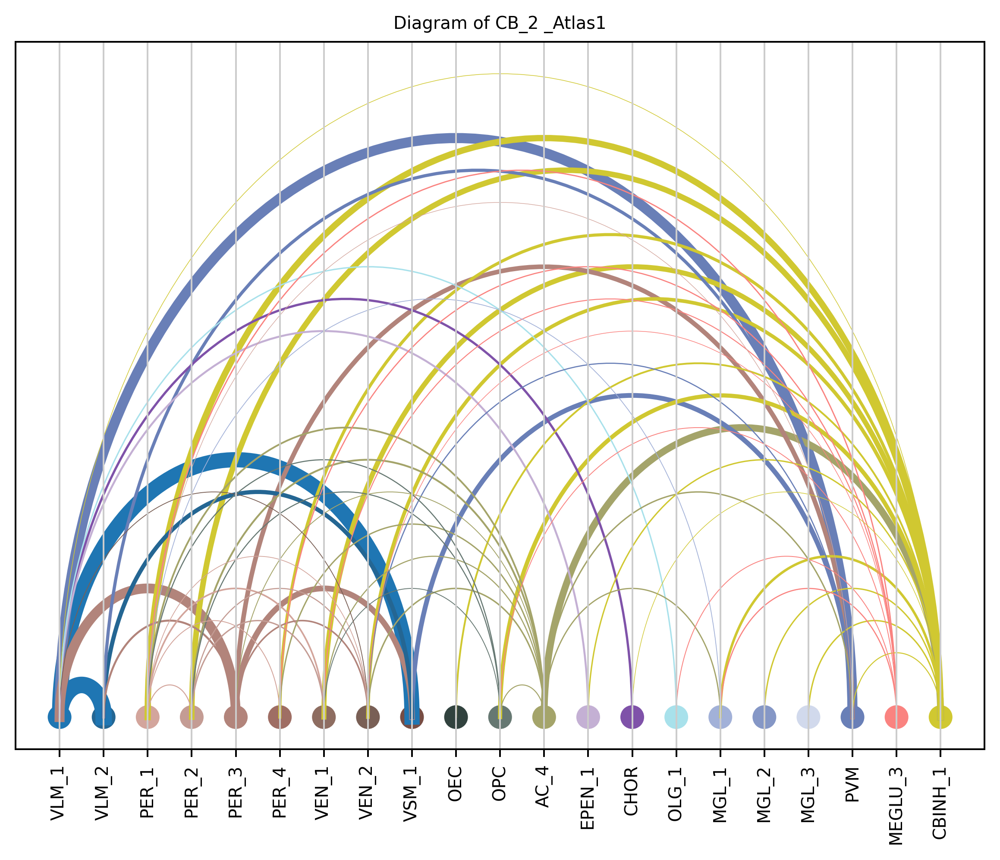

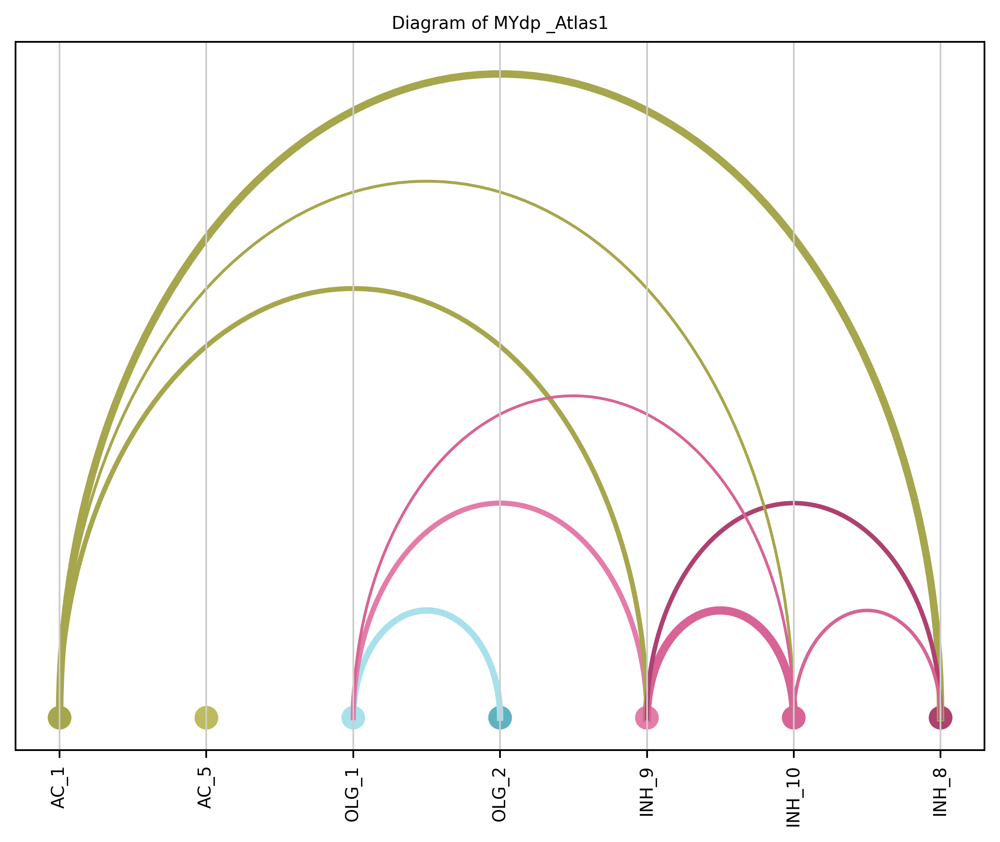

...

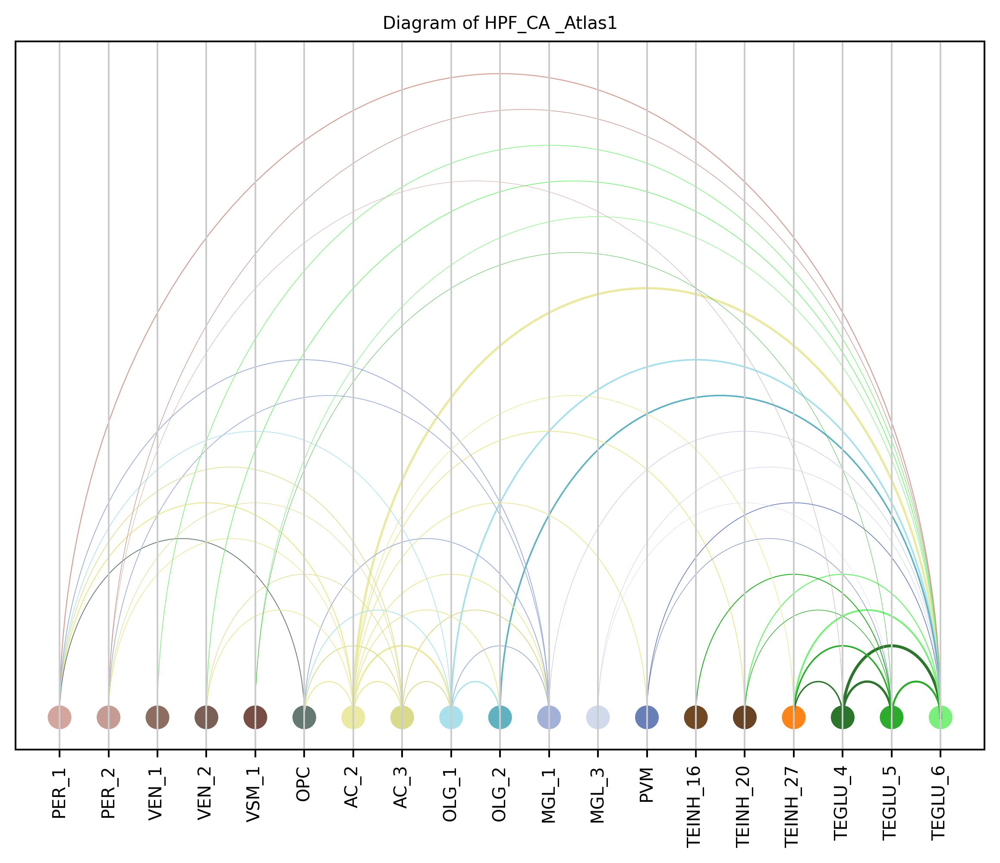

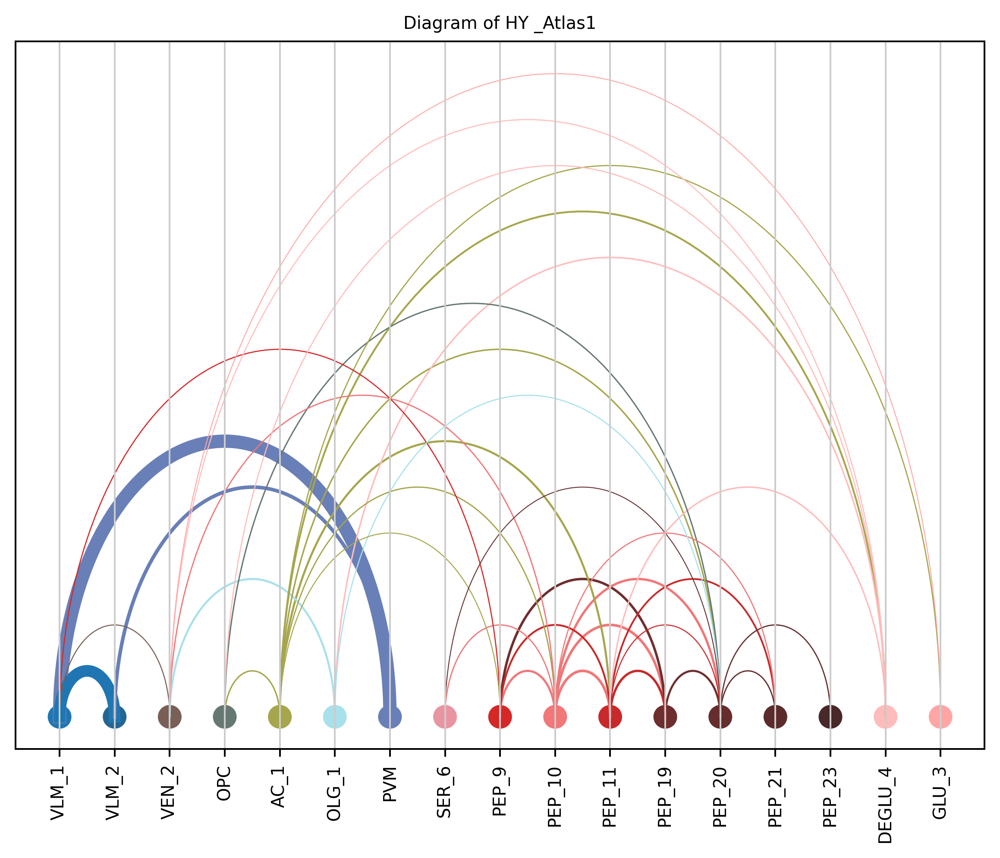

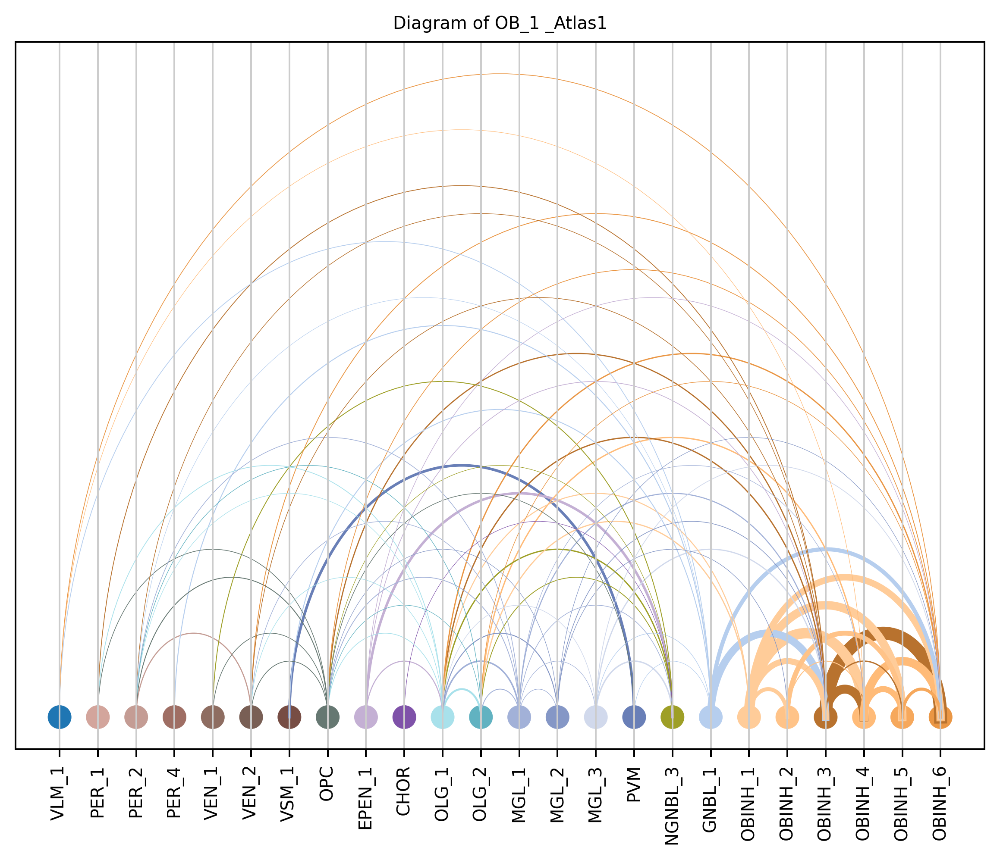

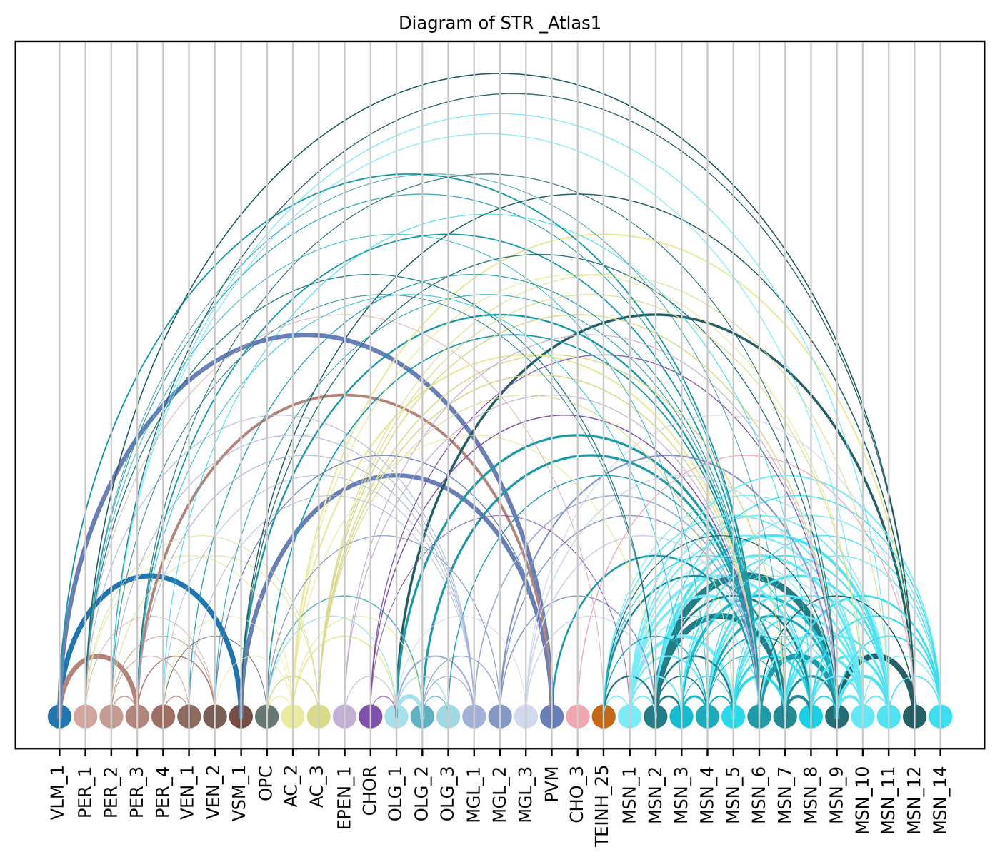

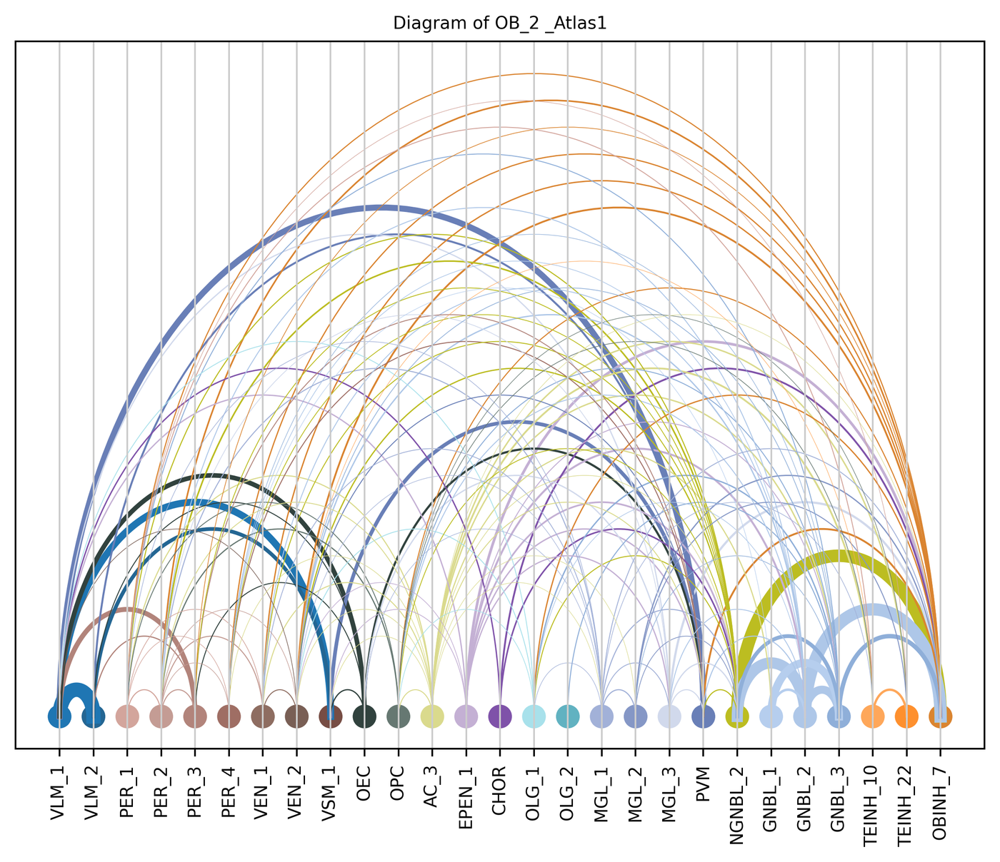

In [16]:
for atlas_source in ['_Atlas1']:
    permutation_path_merfish=f'{SOURCE_DATA_BASE}/outputs_30um{atlas_source}'
    combined_results=pd.read_csv(os.path.join(permutation_path_merfish+'/result/', 'all_close_contacts.csv'))
    save_path=os.path.join(permutation_path_merfish+'/figures_pvalue/')
    os.makedirs(save_path, exist_ok=True)

    for region_i in major_brain_regions:

        combined_results_CB=combined_results.loc[combined_results['region']==region_i]
        if combined_results_CB.shape[0]<2:
            continue
#         print(region_i)
        combined_results_CB['from'] = combined_results_CB['cell_type1']
        combined_results_CB['to'] = combined_results_CB['cell_type2']

        pvalue=combined_results_CB['z_score']
        combined_results_CB['weights'] = pvalue 

        transparency=np.array(-np.log10(combined_results_CB['pval-adjusted']))+10
        transparency[transparency==np.inf]=350
        transparency = NormalizeData(transparency) 
        transparency[transparency<0.7]=0.7
        combined_results_CB['alpha'] = transparency


        combined_results_CB_link =combined_results_CB[['from','to','weights','alpha',]].copy()


        def createArcDiagram(df, node1, node2, weights=None, alpha=None,
                             bg_color='white',
                             cmap='viris', title=f'Diagram of {region_i} {atlas_source}'):

            # get all the nodes
            nodes_old = df[node1].unique().tolist() + df[node2].unique().tolist()
            nodes_old = list(set(nodes_old))

            nodes=[]
            for i in dic_color.keys():
                if i in nodes_old:
                    nodes.append(i)

            custom_colors=[dic_color[i] for i in nodes]
            # create the diagram
            arcdiag = ArcDiagram(nodes, title)
            arcdiag.set_custom_colors(custom_colors)
            arcdiag.set_label_rotation_degree(90)
            if not weights:
                df['weights'] = 0.1

            # connect the nodes
            for connection in df.iterrows():
                arcdiag.connect(
                    connection[1][node1],
                    connection[1][node2],
                    # transparency=connection[1][alpha],
                    linewidth=connection[1][weights],
                    )

            # custom colors
            arcdiag.set_background_color(bg_color)

            # plot the diagram
            # arcdiag.show_plot()
            arcdiag.save_plot_as(f'{save_path}/{region_i}.png', resolution=300) # for saving file as an image with an optional resolution setting for higher-quality images.


        createArcDiagram(
            combined_results_CB_link,
            node1='from',
            node2='to',
            weights='weights',
            alpha='alpha',
        )